<a href="https://colab.research.google.com/github/techn-0/computer_vision_STD/blob/main/4_7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

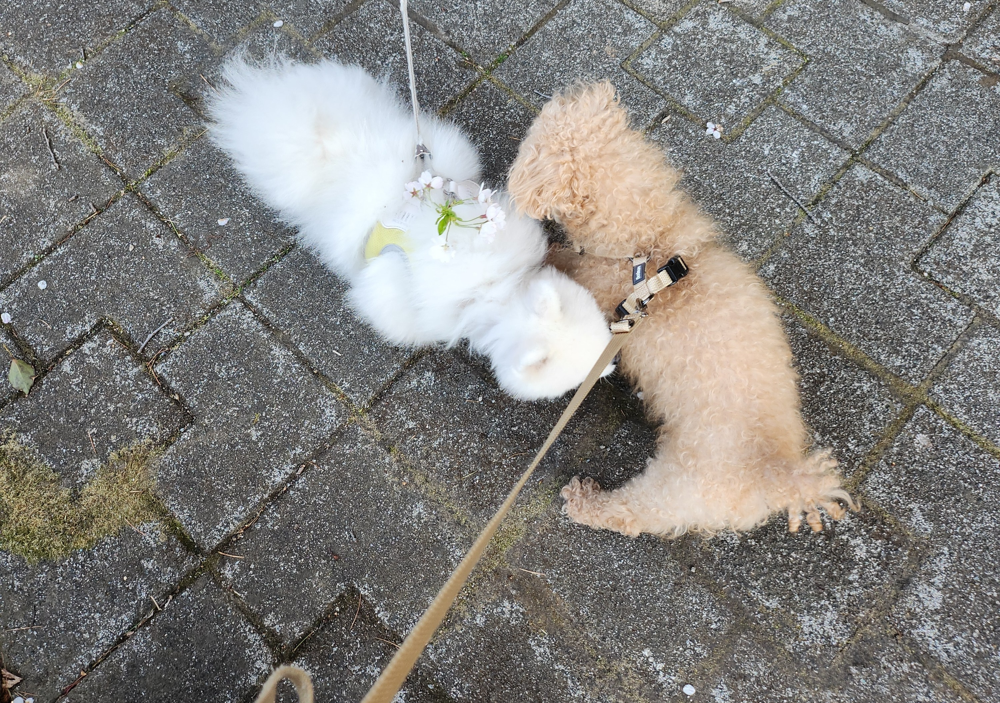

error: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/grabcut.cpp:386: error: (-215:Assertion failed) !bgdSamples.empty() && !fgdSamples.empty() in function 'initGMMs'


In [2]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img = cv.imread('개인싸.jpg')
img_show = np.copy(img)

mask = np.zeros((img.shape[0], img.shape[1]), np.uint8)
mask[:, :] = cv.GC_PR_BGD

BrushSiz = 5
LColor, RColor = (255, 0, 0), (0, 0, 255) # 색상 변경하기

def painting(event, x, y, flags, param):
    if event == cv.EVENT_LBUTTONDOWN:
        cv.circle(img_show, (x, y), BrushSiz, LColor, -1)
        cv.circle(mask, (x, y), BrushSiz, cv.GC_FGD, -1)
    elif event == cv.EVENT_RBUTTONDOWN:
        cv.circle(img_show, (x, y), BrushSiz, RColor, -1)
        cv.circle(mask, (x, y), BrushSiz, cv.GC_BGD, -1)
    elif event == cv.EVENT_MOUSEMOVE and flags == cv.EVENT_FLAG_LBUTTON:
        cv.circle(img_show, (x, y), BrushSiz, LColor, -1)
        cv.circle(mask, (x, y), BrushSiz, cv.GC_FGD, -1)
    elif event == cv.EVENT_MOUSEMOVE and flags == cv.EVENT_FLAG_RBUTTON:
        cv.circle(img_show, (x, y), BrushSiz, RColor, -1)
        cv.circle(mask, (x, y), BrushSiz, cv.GC_BGD, -1)
    cv.imshow('image', img_show)

cv2_imshow(img_show)
cv.setMouseCallback('image', painting)

while(True):
    if cv.waitKey(1) == ord('q'):
        break

background = np.zeros((1, 65), np.float64)
foreground = np.zeros((1, 65), np.float64)

cv.grabCut(img, mask, None, background, foreground, 5, cv.GC_INIT_WITH_MASK)
mask2 = np.where((mask == cv.GC_BGD)|(mask == cv.GC_PR_BGD), 0, 1).astype('uint8')
grabcut = img * mask2[:, :, np.newaxis]

cv2_imshow(grabcut)

In [ ]:
import cv2 as cv
import numpy as np

img = cv.imread('')
img_show = np.copy(img)

mask = np.zeros((img.shape[0], img.shape[1]), np.uint8)
mask[:, :] = cv.GC_PR_BGD

BrushSiz = 5
LColor, RColor = (255, 0, 0), (0, 0, 255) # 색상 변경하기

def painting(event, x, y, flags, param):
    if event == cv.EVENT_LBUTTONDOWN:
        cv.circle(img_show, (x, y), BrushSiz, LColor, -1)
        cv.circle(mask, (x, y), BrushSiz, cv.GC_FGD, -1)
    elif event == cv.EVENT_RBUTTONDOWN:
        cv.circle(img_show, (x, y), BrushSiz, RColor, -1)
        cv.circle(mask, (x, y), BrushSiz, cv.GC_BGD, -1)
    elif event == cv.EVENT_MOUSEMOVE and flags == cv.EVENT_FLAG_LBUTTON:
        cv.circle(img_show, (x, y), BrushSiz, LColor, -1)
        cv.circle(mask, (x, y), BrushSiz, cv.GC_FGD, -1)
    elif event == cv.EVENT_MOUSEMOVE and flags == cv.EVENT_FLAG_RBUTTON:
        cv.circle(img_show, (x, y), BrushSiz, RColor, -1)
        cv.circle(mask, (x, y), BrushSiz, cv.GC_BGD, -1)
    cv.imshow('image', img_show)

cv.imshow('image', img_show)
cv.setMouseCallback('image', painting)

while(True):
    if cv.waitKey(1) == ord('q'):
        break

background = np.zeros((1, 65), np.float64)
foreground = np.zeros((1, 65), np.float64)

cv.grabCut(img, mask, None, background, foreground, 5, cv.GC_INIT_WITH_MASK)
mask2 = np.where((mask == cv.GC_BGD)|(mask == cv.GC_PR_BGD), 0, 1).astype('uint8')
grabcut = img * mask2[:, :, np.newaxis]
cv.imshow('grabcut', grabcut)
cv.waitKey(0)
cv.destroyAllWindows()